**Visualize the Locations of Restaurants on a Map**

In [19]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

In [7]:
# Load the dataset
df = pd.read_csv("C:\\Users\\SUVARCHALA\\Downloads\\Dataset .csv")

In [8]:

# Initialize a map centered around the mean latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10)

In [9]:

# Add points to the map
marker_cluster = MarkerCluster().add_to(restaurant_map)
for idx, row in df.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']], 
                  popup=row['Restaurant Name']).add_to(marker_cluster)


In [10]:
# Save the map as an HTML file
restaurant_map.save('restaurant_map.html')


In [11]:
# Display the map
restaurant_map

**Determine Correlation Between Location and Rating** 

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

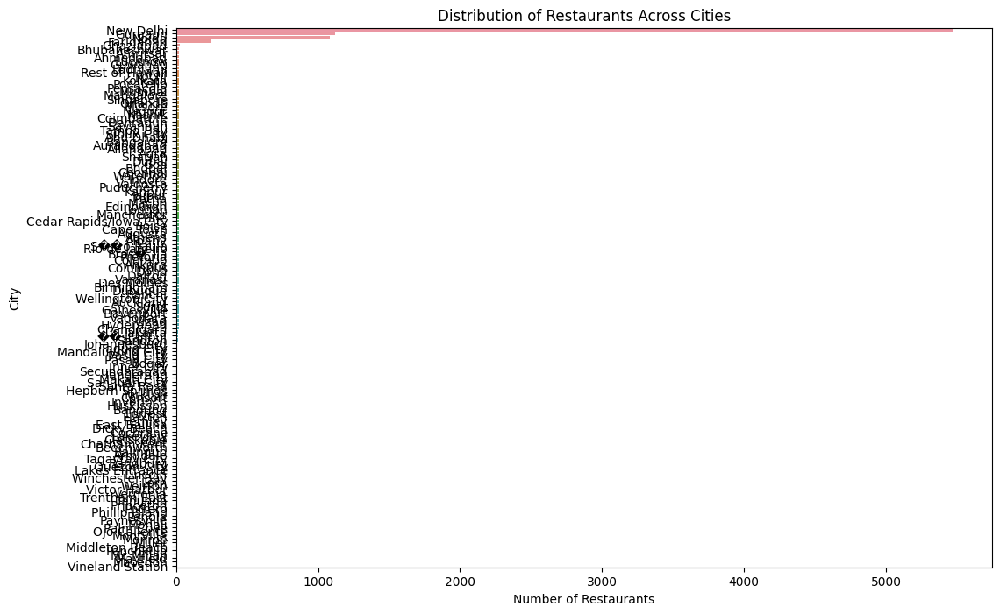

In [23]:
# Analyze distribution of restaurants across cities
plt.figure(figsize=(12, 8))
sns.countplot(y='City', data=df, order=df['City'].value_counts().index)
plt.title('Distribution of Restaurants Across Cities')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

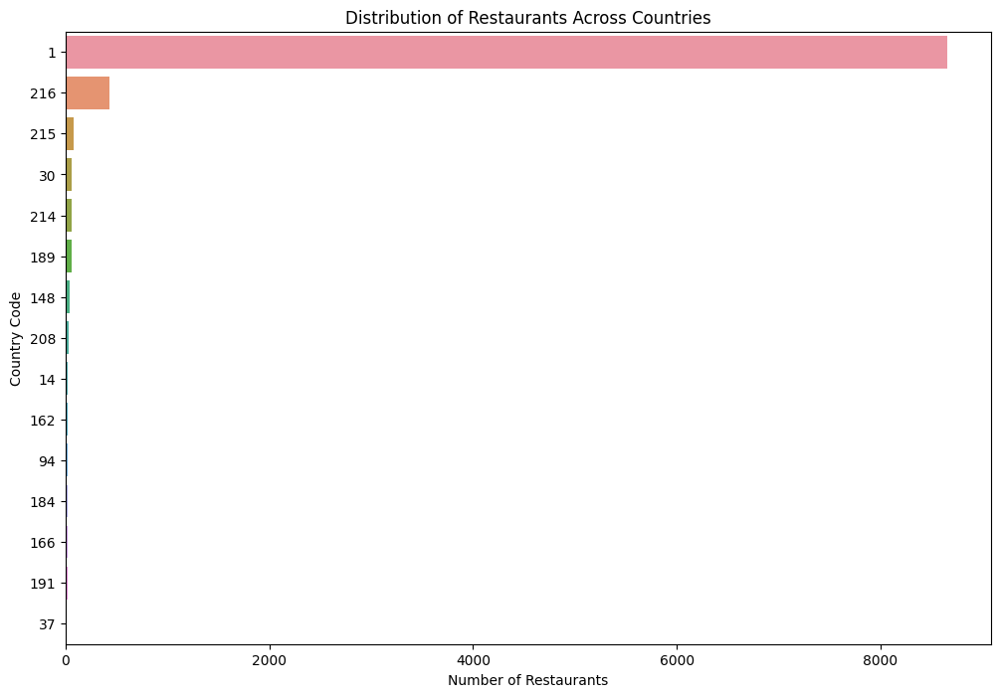

In [24]:
# Analyze distribution of restaurants across countries
plt.figure(figsize=(12, 8))
sns.countplot(y='Country Code', data=df, order=df['Country Code'].value_counts().index)
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country Code')
plt.show()

**Determine Correlation Between Location and Rating**

In [25]:
import numpy as np
from scipy.stats import pearsonr


In [26]:
# Calculate the correlation between latitude and aggregate rating
corr_lat, _ = pearsonr(df['Latitude'], df['Aggregate rating'])
print(f'Correlation between Latitude and Aggregate Rating: {corr_lat:.4f}')


Correlation between Latitude and Aggregate Rating: 0.0005


In [27]:
# Calculate the correlation between longitude and aggregate rating
corr_lon, _ = pearsonr(df['Longitude'], df['Aggregate rating'])
print(f'Correlation between Longitude and Aggregate Rating: {corr_lon:.4f}')


Correlation between Longitude and Aggregate Rating: -0.1168


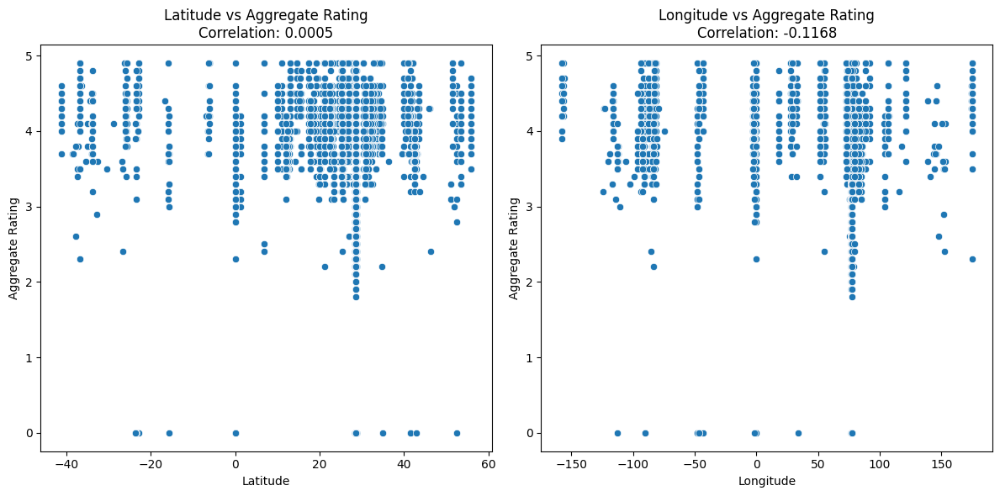

In [18]:
# Visualize the correlation
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='Latitude', y='Aggregate rating', data=df)
plt.title(f'Latitude vs Aggregate Rating\nCorrelation: {corr_lat:.4f}')
plt.xlabel('Latitude')
plt.ylabel('Aggregate Rating')

plt.subplot(1, 2, 2)
sns.scatterplot(x='Longitude', y='Aggregate rating', data=df)
plt.title(f'Longitude vs Aggregate Rating\nCorrelation: {corr_lon:.4f}')
plt.xlabel('Longitude')
plt.ylabel('Aggregate Rating')

plt.tight_layout()
plt.show()